# Helper Functions for Batch B-Field Analysis

This notebook contains cells with code for batch analyzing multiple datasets in parallel. Here are all the loops for loading in raw data, downsampling, generating input decks, submitting jobs to Cori, and processing and plotting the output results once those jobs have finished.

In [8]:
# Import all the dependencies
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from skimage.measure import block_reduce
import os
from skimage import io
import astropy.units as u
from astropy.units import dimensionless_unscaled as dl
from astropy.constants import e, c, m_e, mu0
from src.plotting import *
from src import voronoi
from scipy.io import savemat
e = e.to(u.C)

# set plotting style
%matplotlib inline
plt.style.reload_library()
plt.style.use('ucla_presentations')
mpl.rcParams['text.usetex'] = False

## Downsample Target Plane Images

The cell below loads each image file in a directory and downsamples it by a factor of 2 on each axis, and saves to a subdirectory.

In [ ]:
data_dir = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/30psig-data-new/dust_removed/'
save_dir = data_dir + 'downsampled/'

files = os.listdir(data_dir) # load all of the filenames in the directory into a list

for filename in files:
    if '.png' in filename:
        print(filename)
        data = io.imread(data_dir + filename, as_gray=True)

        data = block_reduce(data, (2,2))

        plt.imsave(save_dir + filename, data, cmap='gray')    # downsample by a factor of 2 on both axes
   
   

## Batch Submit Shots to Invert

The cell below loads in all the image files in a data folder, writes an input deck to the inversion code for each one that does not already have a completed output file. The following cell submits each of those shots to Cori to run on its own node.

In [ ]:
submit_script_fname = 'ae98_batch_submit.sh'

# Directory containing each shot as a .png
data_dir = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/30psig-data-new/dust_removed/downsampled/'

# .npz file containing the source plane tesselation to reuse
# (rather than running lloyd relaxation again)
#source_plane_fname = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/160psi-data-new/dust_removed/inverted/co2_44.0mJ_delayRail205mm_micro9mm_PMQs41mm_h2_164.8psig/co2_44.0mJ_delayRail205mm_micro9mm_PMQs41mm_h2_164.8psig_output_inverted.npz'
source_plane_fname = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/results.npz'
# Get number of sites from given source plane file
N_sites = np.load(source_plane_fname)['sites'].shape[0]

files = os.listdir(data_dir) # load all of the filenames in the directory into a list
input_files = []
# Load in the template input deck
template_file = open('input/ae98_2022-template.py', 'r')
template = template_file.read().replace('DATA_DIR', data_dir)
template = template.replace('SOURCE_FILE', source_plane_fname)
template = template.replace('N_SITES', str(N_sites))
template_file.close()

for filename in files:
    # Filter out all the background images and matlab binaries
    if '.png' in filename and 'source' not in filename:# and filename != 'co2_44.0mJ_delayRail205mm_micro9mm_PMQs41mm_h2_164.8psig.png':
        if filename[:-4]+'_output_inverted.npz' not in os.listdir(data_dir+'inverted/'+filename[:-4]+'/'):
            # This file has an output directory but no output file, must have timed out previously
            print(filename)
            # Python does not like periods in the input deck filename
            input_fname = filename[:-4].replace('.',',')+'_input'
            input_files.append(input_fname)
            
            # Edit the input deck template to point to this shot and save
            input_string = template.replace('DATA_FNAME', filename[:-4])

            input_file = open('input/'+input_fname+'.py', 'w')
            input_file.write(input_string)
            input_file.close()

In [ ]:
# Write a submission script and submit jobs for each input deck given
N_files = len(input_files)
print(f'Writing batch job script to analyze {N_files} images')

for input_file in input_files:
    submit_script = f'''#!/bin/bash
#SBATCH --nodes=1
#SBATCH --time=10:00:00
#SBATCH --constraint=knl
#SBATCH --tasks-per-node=68
#SBATCH --qos=regular
#SBATCH --job-name={input_file}
#SBATCH --error=%x-%j.err
#SBATCH --output=%x-%j.out
#SBATCH --mail-user=oods@nersc.gov
#SBATCH --mail-type=ALL

# set up for problem & define any environment variables here
module load python
conda activate shadow_2021
export KMP_AFFINITY=disabled

srun -n 1 --cpu-bind=none python3 invert.py {input_file}
'''
    submit = open(submit_script_fname, 'w')
    submit.write(submit_script)
    submit.close()
    
    # Submit job
    os.system(f'sbatch {submit_script_fname}')

print(f'Submission script written to {submit_script_fname}')

## Batch Analyze Completed Runs

The cell below opens each shot folder in an output directory, loads in the result of a completed inversion, converts into real units, saves plots of the deflection angles, magnetic fields, and current density, and then saves the calculation as a Matlab file.

co2_51.9mJ_delayRail205mm_micro9.0mm_PMQs41mm_h2_31.6psig_output_inverted.npz


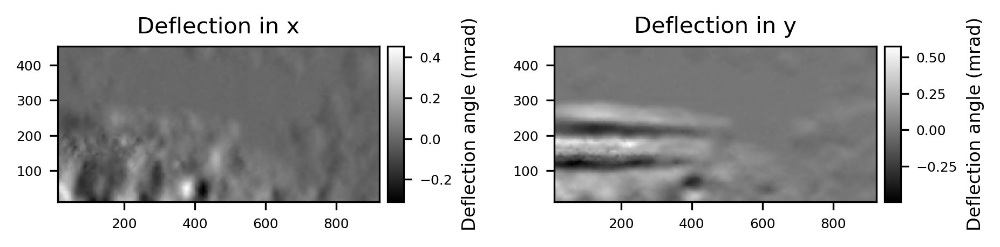

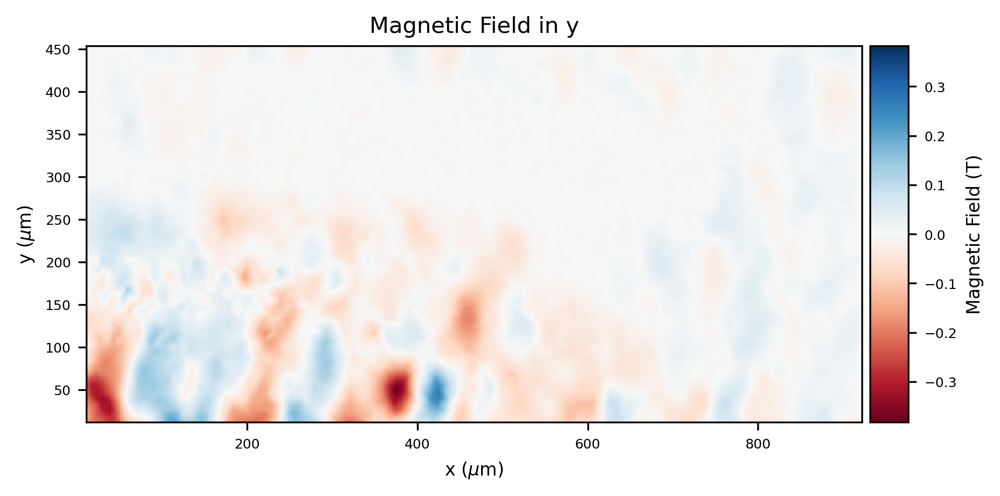

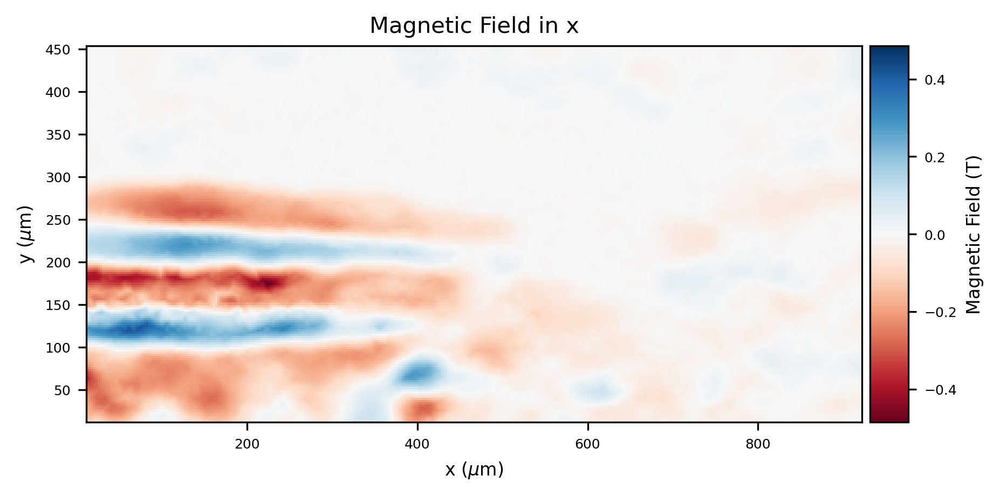

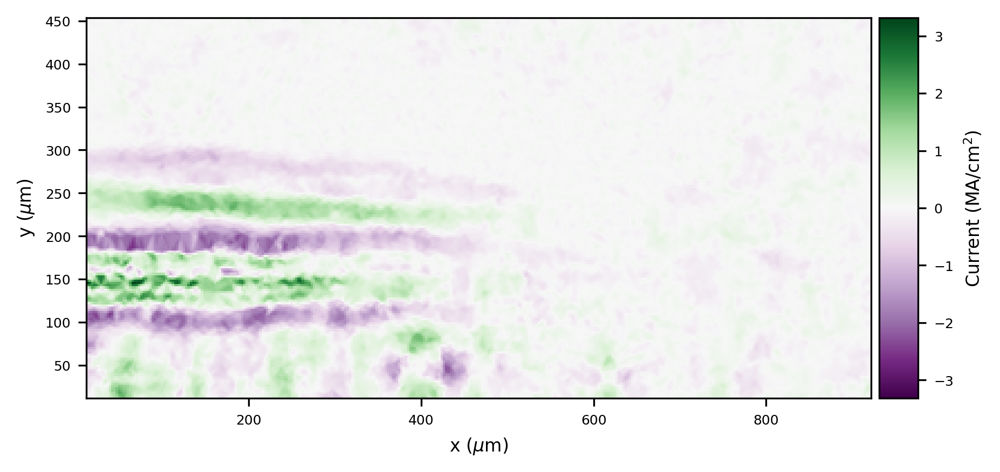

(6480, 2)
co2_45.8mJmJ_delayRail205mm_micro0.0mm_PMQs41mm_h2_31.8psig_output_inverted.npz


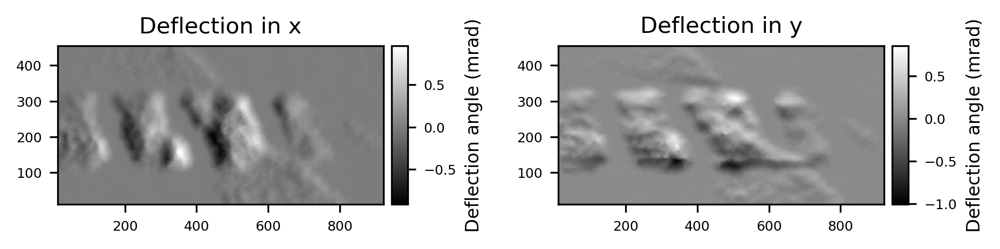

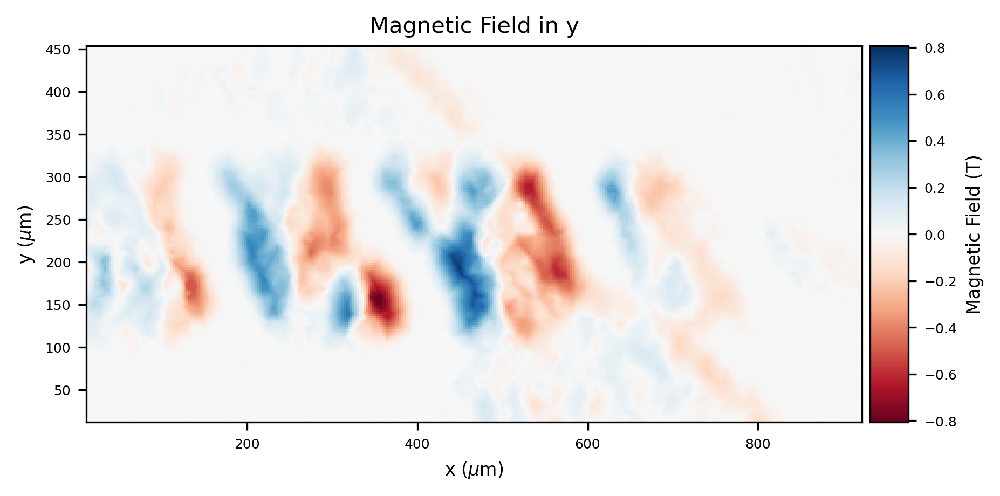

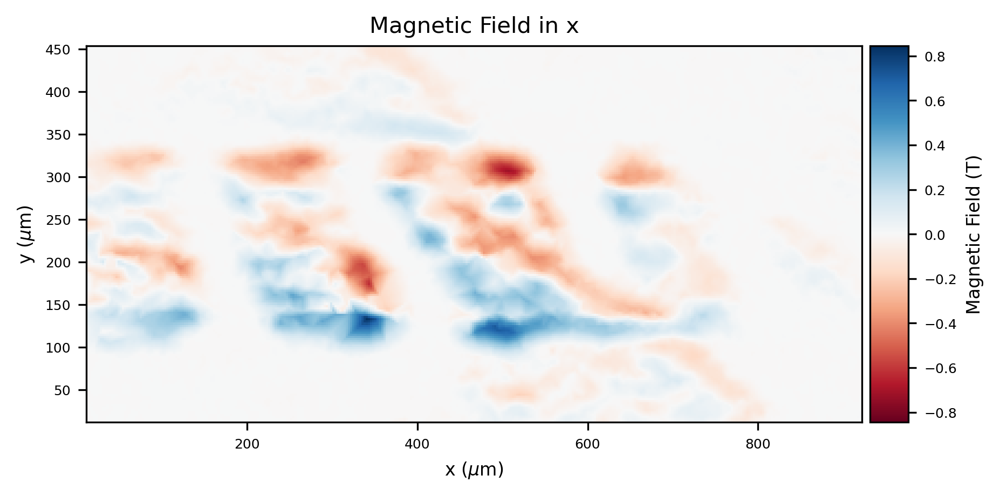

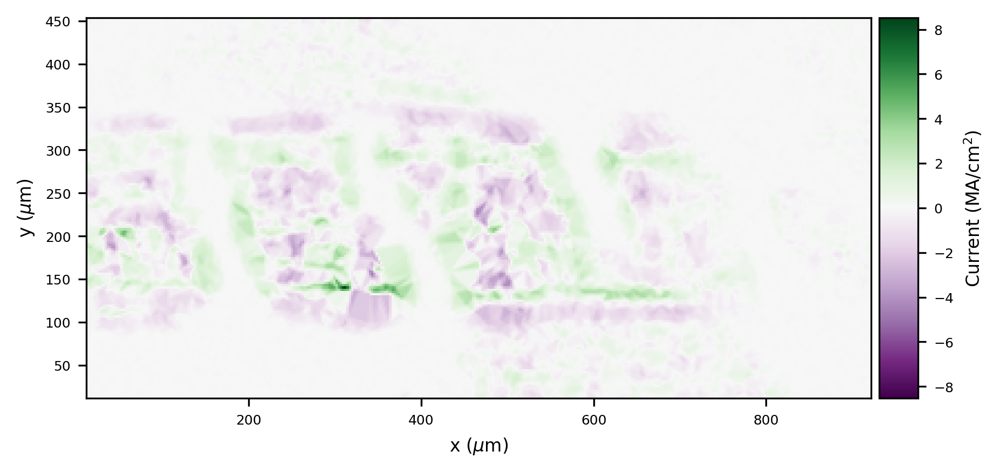

(6480, 2)
co2_52.0mJ_delayRail205mm_micro2.0mm_PMQs41mm_h2_31.8psig_output_inverted.npz


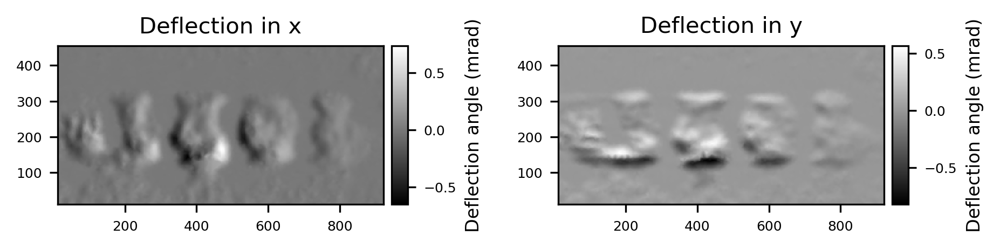

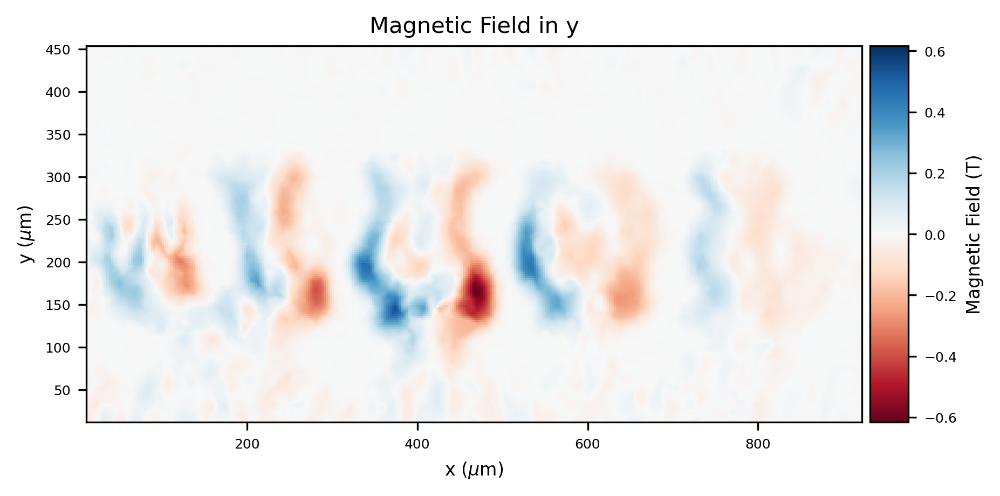

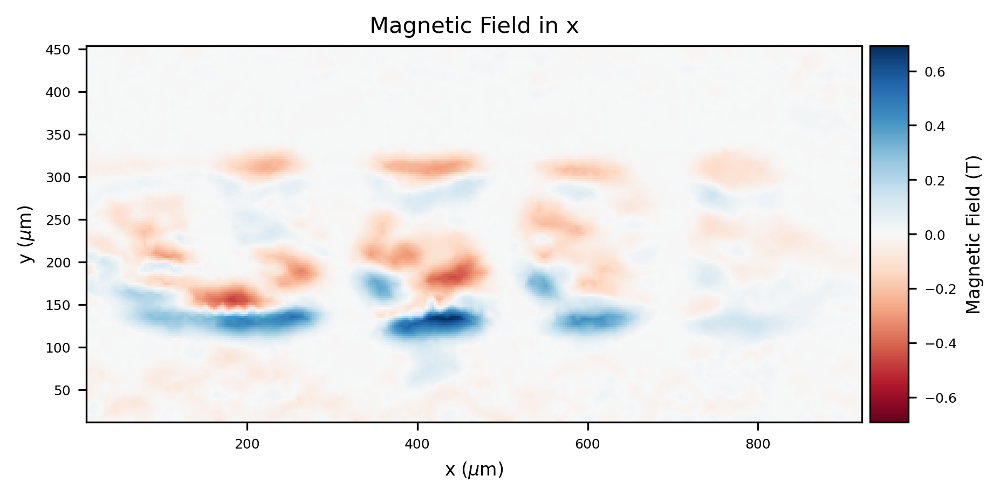

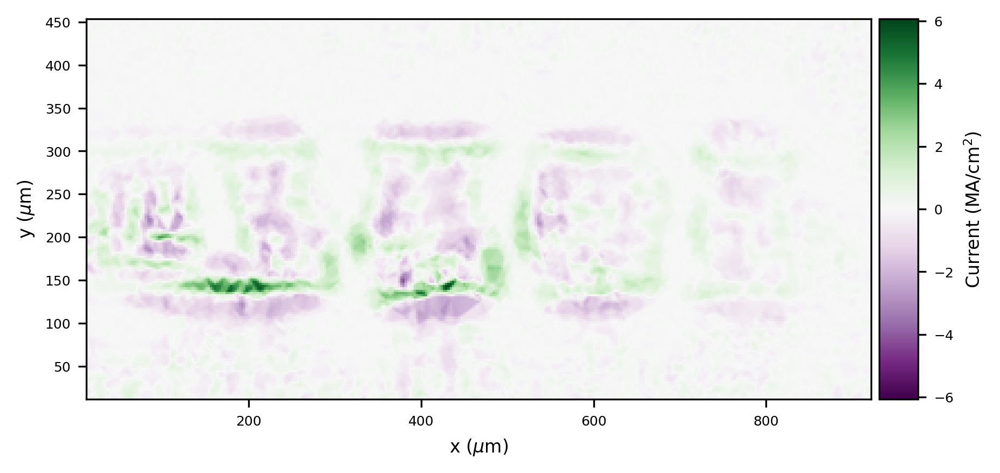

(6480, 2)
co2_81.9mJ_delayRail205mm_micro8.0mm_PMQs41mm_h2_31.6psig_output_inverted.npz


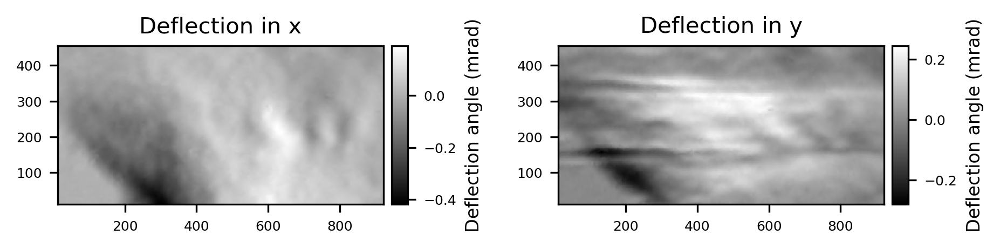

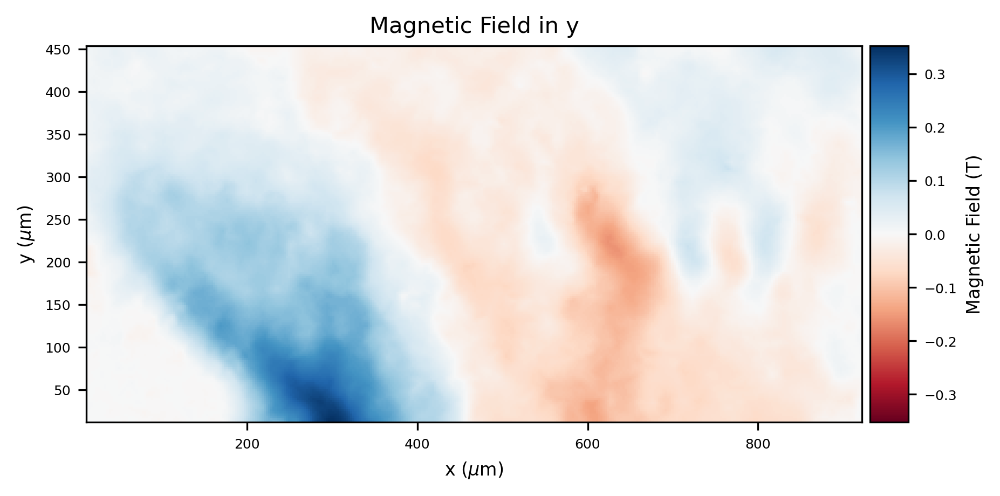

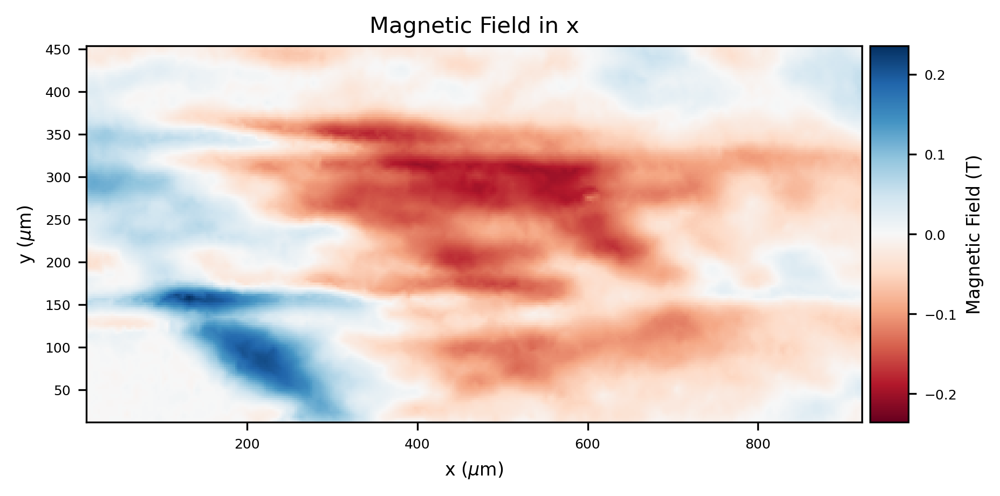

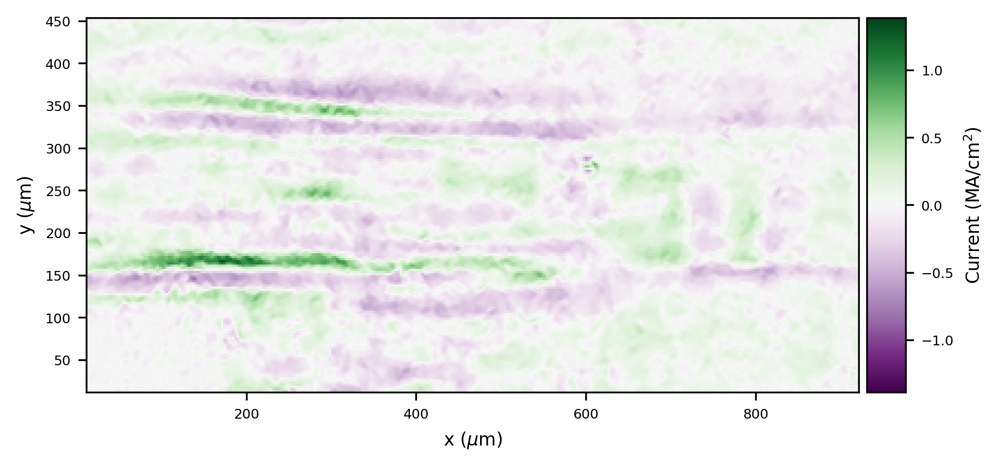

(6480, 2)
co2_49.3mJmJ_delayRail205mm_micro0.0mm_PMQs41mm_h2_31.7psig_output_inverted.npz


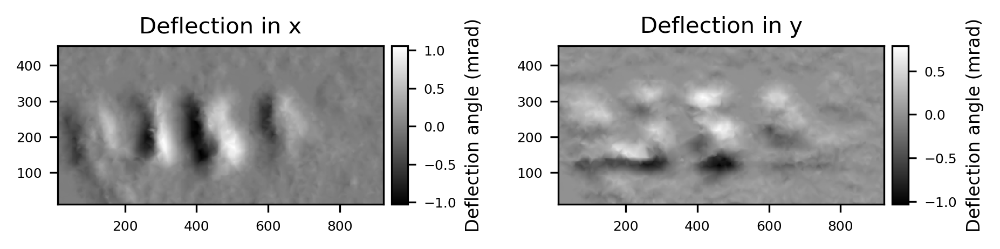

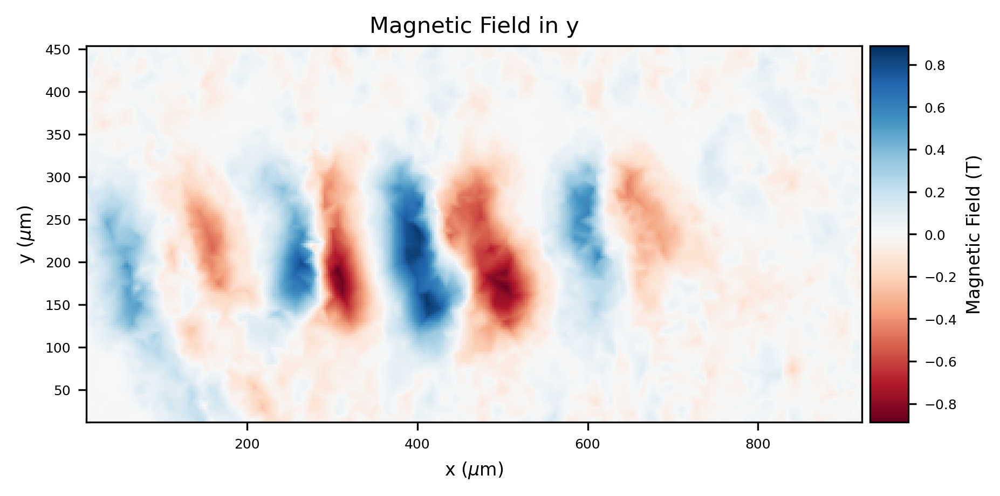

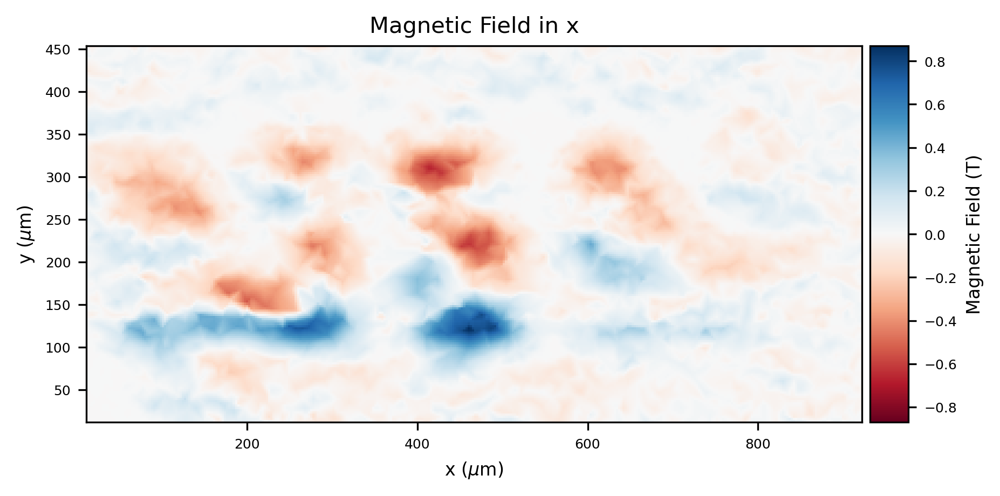

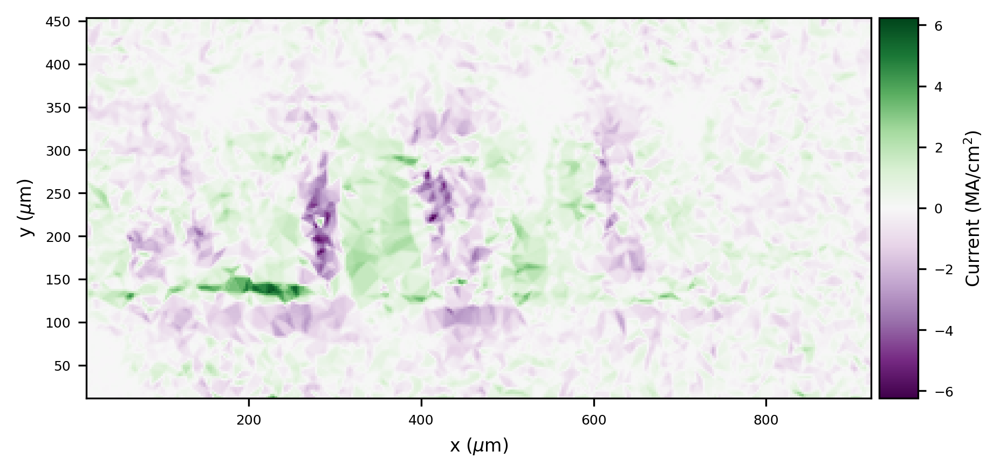

(6480, 2)


In [7]:
# Define the experiment parameters for converting into real units
pix_size = 1.3 * u.um # pixel size (magnification already included)
# (17.8 total, 4.8x optical magnification, 3.7x PMQ magnification)
tar_dist = 3   * u.cm # distance from IP to object plane of PMQs
M = 2 # magnification from downsampling the data
pad=5 # padding to crop out of plots, in pixels (edges can be very misleading)

W = 200 * u.um
E = 50.5 * u.MeV

#data_dir = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/30psig-data-new/dust_removed/inverted/'
data_dir = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/30psig-data-new/dust_removed/downsampled/inverted/'
#data_dir = '/global/homes/o/oods/inverse_shadowgraphy/2022_data/160psi-data-new/dust_removed/inverted/'
folders = [x[0] for x in os.walk(data_dir)][1:] # load all of the filenames in the directory into a list

for folder in folders:
    files = os.listdir(folder)
    # Filter out all the background images and matlab binaries
    for filename in files:
        if '.npz' in filename and 'restart' not in filename:
            # This file is a completed inversion output file!
            print(filename)
            # Python does not like periods in the filename
            output_fname = filename[:-4].replace('.',',')
            
            # Load in the results
            res = dict(np.load(folder +'/'+ filename))
            a_x = res['alpha_x']
            a_y = res['alpha_y']
            tar_img = res['target_image']
            Y, X = np.indices(tar_img.shape, dtype=float) * (pix_size.value * M)
            
            # Convert pixel displacement to deflection angle in radians
            angle_x = a_x  * (pix_size * M / tar_dist).to_value(dl)
            angle_y = a_y  * (pix_size * M / tar_dist).to_value(dl) 

            fig, (ax1, ax2) = plt.subplots(1,2)

            im1 = ax1.pcolormesh(X[pad:-pad, pad:-pad],Y[pad:-pad, pad:-pad], 1e3* angle_x[pad:-pad, pad:-pad], cmap='gray',)
            ax1.set_aspect('equal')
            cbar1 = colorbar(im1)
            cbar1.set_label('Deflection angle (mrad)')
            #no_ticks(ax1)
            ax1.set_title("Deflection in x")

            im2 = ax2.pcolormesh(X[pad:-pad, pad:-pad],Y[pad:-pad, pad:-pad], 1e3 * angle_y[pad:-pad, pad:-pad], cmap='gray',)
            ax2.set_aspect('equal')
            cbar2 = colorbar(im2)
            cbar2.set_label('Deflection angle (mrad)')

            #no_ticks(ax2)
            ax2.set_title("Deflection in y")
            plt.savefig(folder +'/'+ output_fname+'_alpha_xy.png')
            plt.show()



            gamma = (E / (m_e * c**2)).to(u.dimensionless_unscaled)

            By = (angle_x * np.sqrt(gamma**2 - 1) * m_e * c /  (-e * W)).to(u.T)
            Bx = (angle_y * np.sqrt(gamma**2 - 1) * m_e * c /  (-e * W)).to(u.T)

            fig, ax = plt.subplots()

            im = ax.pcolormesh(X[pad:-pad, pad:-pad],Y[pad:-pad, pad:-pad], By[pad:-pad, pad:-pad], cmap='RdBu',vmax = max(By[pad:-pad, pad:-pad].max(), abs(By[pad:-pad, pad:-pad].min())).value, vmin = -1* max(By[pad:-pad, pad:-pad].max(), abs(By[pad:-pad, pad:-pad].min())).value)
            ax.set_aspect('equal')
            cbar = colorbar(im)
            cbar.set_label('Magnetic Field (T)')
            ax.set_xlabel('x ($\mu$m)')
            ax.set_ylabel('y ($\mu$m)')
            ax.set_title("Magnetic Field in y")
            plt.savefig(folder +'/'+ output_fname+'_By.png')
            plt.show()

            fig, ax = plt.subplots()

            im = ax.pcolormesh(X[pad:-pad, pad:-pad],Y[pad:-pad, pad:-pad], Bx[pad:-pad, pad:-pad], cmap='RdBu', vmax = max(Bx[pad:-pad, pad:-pad].max(), abs(Bx[pad:-pad, pad:-pad].min())).value, vmin = -1* max(Bx[pad:-pad, pad:-pad].max(), abs(Bx[pad:-pad, pad:-pad].min())).value)
            ax.set_aspect('equal')
            cbar = colorbar(im)
            cbar.set_label('Magnetic Field (T)')
            ax.set_xlabel('x ($\mu$m)')
            ax.set_ylabel('y ($\mu$m)')
            ax.set_title("Magnetic Field in x")
            plt.savefig(folder +'/'+ output_fname+'_Bx.png')

            plt.show()
            # Calculate the current from the fields in both directions
            dBx = np.gradient(Bx, axis=0) / (pix_size * M)
            dBy = np.gradient(By, axis=1) / (pix_size * M)
            Jz = (1/mu0 * (dBy - dBx)).to(u.MA / u.cm**2)

            fig, ax = plt.subplots()
            im = ax.pcolormesh(X[pad:-pad, pad:-pad],Y[pad:-pad, pad:-pad], Jz[pad:-pad, pad:-pad], cmap='PRGn', vmax = max(Jz[pad:-pad, pad:-pad].max(), abs(Jz[pad:-pad, pad:-pad].min())).value, vmin = -1* max(Jz[pad:-pad, pad:-pad].max(), abs(Jz[pad:-pad, pad:-pad].min())).value)
            cbar = colorbar(im)
            cbar.set_label('Current (MA/cm$^2$)')
            ax.set_aspect('equal')
            ax.set_xlabel('x ($\mu$m)')
            ax.set_ylabel('y ($\mu$m)')
            plt.savefig(folder +'/'+ output_fname+'_Jz.png')
            plt.show()

            res['B_x'] = Bx.to_value(u.T)
            res['B_y'] = By.to_value(u.T)
            res['J_z'] = Jz.to_value(u.MA / u.cm**2)
            print(res['sites'].shape)
            savemat(folder +'/'+ output_fname + '.mat', res)

The cell below will plot the final power diagram for each completed shot. Note that this will take a very long time for full resolution images and many sites, since plotting these power diagrams in Python is *slow*. I'd only recommend doing this with downsampled images using fewer than 10,000 sites (even then it will take a few minutes to plot each one).

co2_51.9mJ_delayRail205mm_micro9.0mm_PMQs41mm_h2_31.6psig_output_inverted.npz


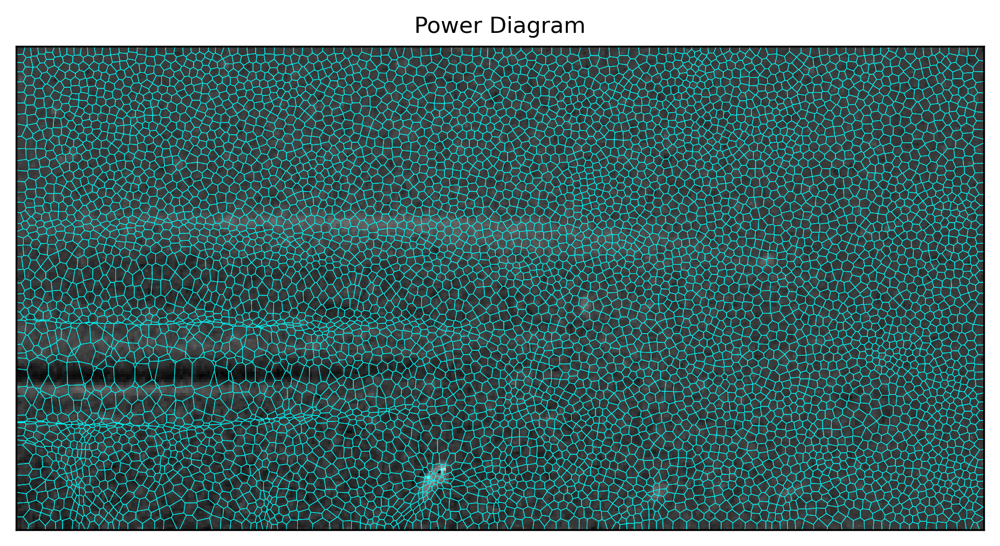

co2_45.8mJmJ_delayRail205mm_micro0.0mm_PMQs41mm_h2_31.8psig_output_inverted.npz


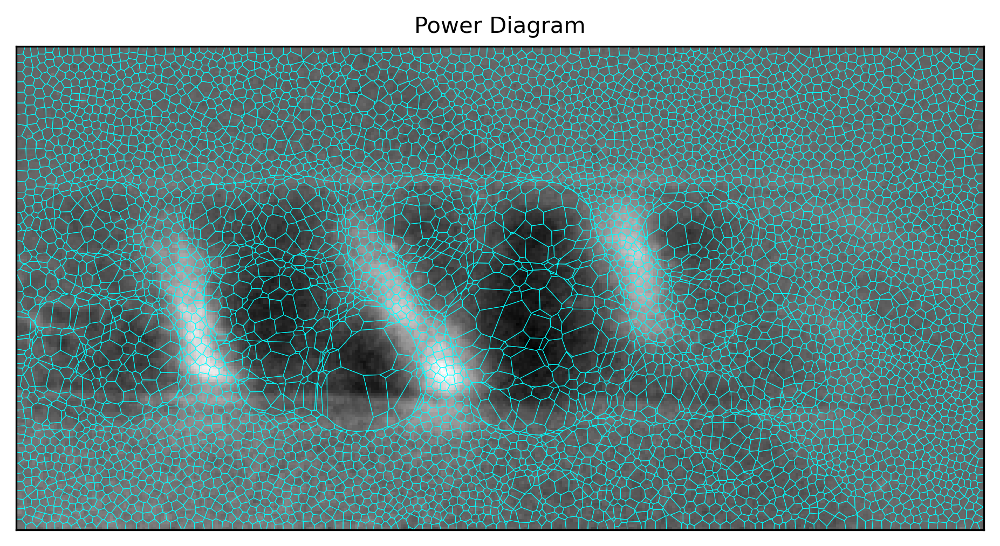

co2_52.0mJ_delayRail205mm_micro2.0mm_PMQs41mm_h2_31.8psig_output_inverted.npz


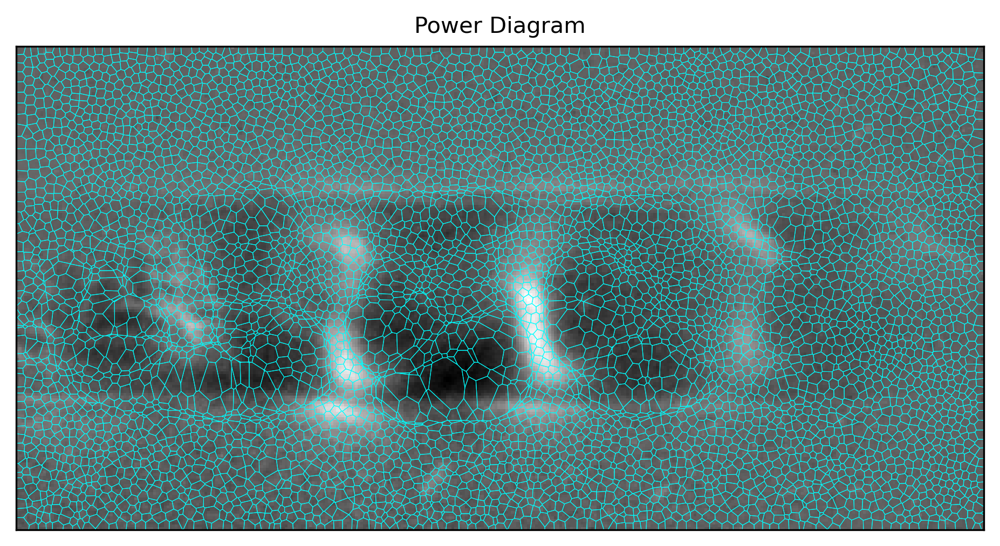

co2_81.9mJ_delayRail205mm_micro8.0mm_PMQs41mm_h2_31.6psig_output_inverted.npz


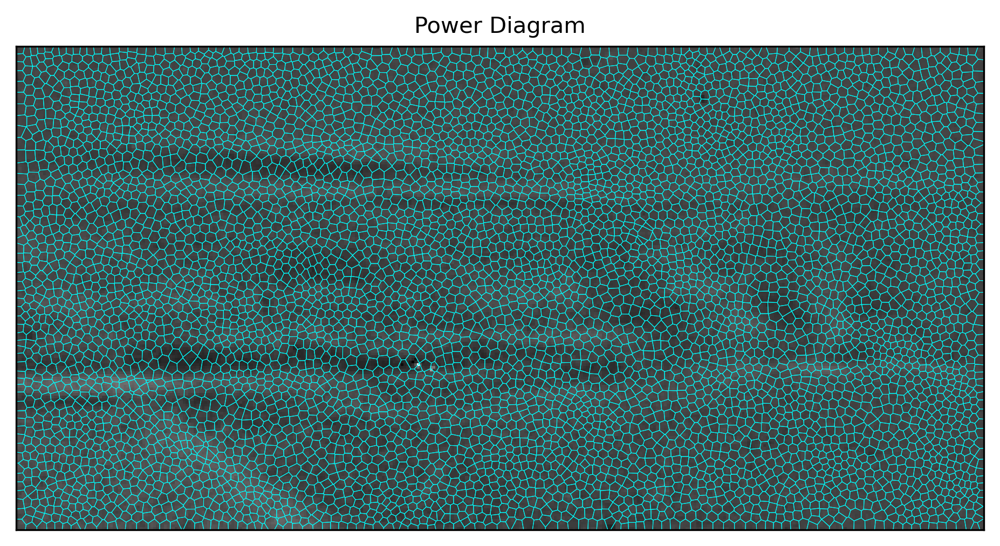

co2_49.3mJmJ_delayRail205mm_micro0.0mm_PMQs41mm_h2_31.7psig_output_inverted.npz


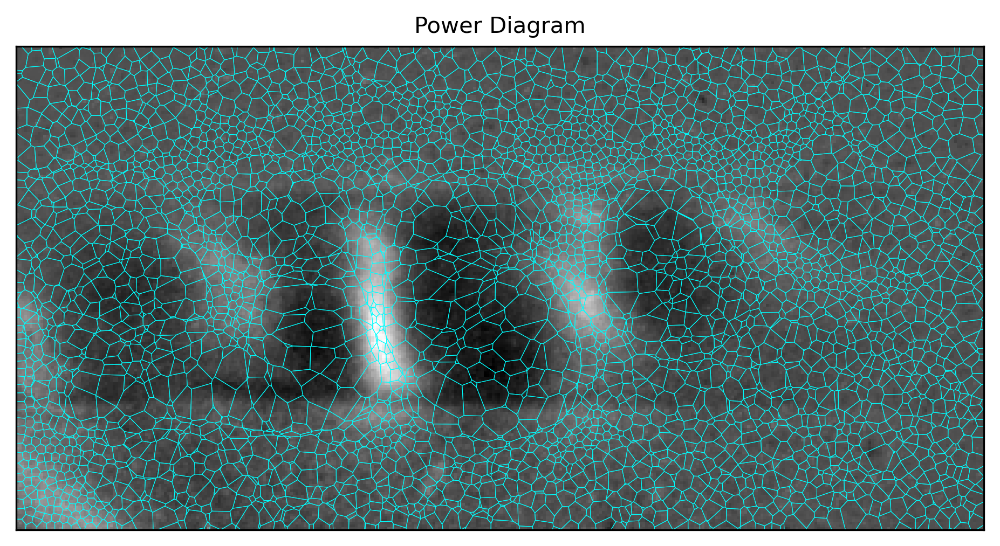

In [9]:
# Plot the optimized power diagrams 
for folder in folders:
    files = os.listdir(folder)
    # Filter out all the background images and matlab binaries
    for filename in files:
        if '.npz' in filename and 'restart' not in filename:
            # This file is a completed inversion output file!
            print(filename)
            # Python does not like periods in the filename
            output_fname = filename[:-4].replace('.',',')
            
            # Load in the results
            res = dict(np.load(folder +'/'+ filename))
            a_x = res['alpha_x']
            a_y = res['alpha_y']
            tar_img = res['target_image']
            Y, X = np.indices(tar_img.shape, dtype=float) * (pix_size.value * M)
            
            vor = voronoi.Voronoi(res['sites'],weights=res['weights'], shape=res['target_image'].shape, image=res['target_image'])
            fig, ax = plt.subplots()

            vor.plot(ax=ax, sites=False, plot_image = True,  lw=.25)
            plt.savefig(folder +'/'+ output_fname+'_power_diagram.png')

            plt.show()
            